# Mask RCNN

In [1]:
!nvidia-smi

Mon Nov  3 09:42:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   52C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!python --version
!nvcc --version


Python 3.12.12
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0


# Install Roboflow & Detectron2

In [3]:
!pip install roboflow
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!git clone https://github.com/facebookresearch/detectron2.git
%cd detectron2
!python -m pip install -e .


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 83.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 128.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
Looking in indexes: https://download.pytorch.org/whl/cu118
Cloning into 'detectron2'...
remote: Enumerating objects: 15920, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 15920 

In [4]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("Detectron2 installed and working!")


Detectron2 installed and working!


# Roboflow API Key

QQP2hmDA6hdwWPeX6IJb

In [5]:
import os
from getpass import getpass

os.environ['ROBOFLOW_API_KEY'] = getpass('Enter Roboflow API key: ')


Enter Roboflow API key: ··········


# Download Dataset in COCO Format

In [6]:
from roboflow import Roboflow

!pip install roboflow

rf = Roboflow(api_key=os.environ['ROBOFLOW_API_KEY'])
project = rf.workspace("tree-soyjd").project("queen-cells-segment-ri9y6-f88wd-p286k-bjq11")
version = project.version(1)
dataset = version.download("coco-segmentation")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to queen-cells-segment-1 in coco-segmentation:: 100%|██████████| 4572/4572 [00:01<00:00, 3613.41it/s]


In [7]:
import json, os
from collections import Counter

dataset_path = "/content/detectron2/queen-cells-segment-1"
splits = ["train", "valid", "test"]

for split in splits:
    json_file = os.path.join(dataset_path, split, "_annotations.coco.json")
    with open(json_file, "r") as f:
        data = json.load(f)

    # List all categories in JSON
    categories = [cat["name"] for cat in data["categories"]]
    print(f"{split} categories: {categories}")

    # Count annotations per category
    counts = Counter([data["categories"][ann["category_id"]]["name"] for ann in data["annotations"]])
    print(f"{split} annotation counts: {counts}\n")


train categories: ['queen-cells-SS5v-vrW4', 'capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']
train annotation counts: Counter({'matured_cell': 7977, 'semi-matured_cell': 4294, 'open_cell': 4166, 'capped_cell': 3483, 'failed_cell': 978})

valid categories: ['queen-cells-SS5v-vrW4', 'capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']
valid annotation counts: Counter({'matured_cell': 149, 'open_cell': 107, 'capped_cell': 81, 'semi-matured_cell': 73, 'failed_cell': 11})

test categories: ['queen-cells-SS5v-vrW4', 'capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']
test annotation counts: Counter({'matured_cell': 70, 'capped_cell': 53, 'semi-matured_cell': 46, 'open_cell': 41, 'failed_cell': 14})



# Register Dataset in Detectron2

In [8]:
from detectron2.data.datasets import register_coco_instances

dataset_path = "/content/detectron2/queen-cells-segment-1"

register_coco_instances("queen_cells_train", {}, f"{dataset_path}/train/_annotations.coco.json", f"{dataset_path}/train")
register_coco_instances("queen_cells_val", {}, f"{dataset_path}/valid/_annotations.coco.json", f"{dataset_path}/valid")
register_coco_instances("queen_cells_test", {}, f"{dataset_path}/test/_annotations.coco.json", f"{dataset_path}/test")

print("Datasets registered!")


Datasets registered!


In [10]:
from detectron2.data import MetadataCatalog

thing_classes = ['capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']
for split in ["queen_cells_train", "queen_cells_val", "queen_cells_test"]:
    MetadataCatalog.get(split).thing_classes = thing_classes


In [13]:
import json, os

dataset_path = "/content/detectron2/queen-cells-segment-1"

valid_classes = ['capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']
class_to_id = {name: idx for idx, name in enumerate(valid_classes)}  # mapping to 0-4


In [14]:
splits = ["train", "valid", "test"]

for split in splits:
    json_file = os.path.join(dataset_path, split, "_annotations.coco.json")

    with open(json_file, "r") as f:
        data = json.load(f)

    data["categories"] = [{"id": idx, "name": name} for idx, name in enumerate(valid_classes)]

    cleaned_annotations = []
    for ann in data["annotations"]:
        old_cat_name = next((cat['name'] for cat in data["categories"] if cat["id"] == ann["category_id"]), None)
        for cat in valid_classes:
            if old_cat_name == cat:
                ann["category_id"] = class_to_id[cat]
                cleaned_annotations.append(ann)
                break
    data["annotations"] = cleaned_annotations

    with open(json_file, "w") as f:
        json.dump(data, f, indent=2)

    print(f"{split} cleaned: {len(cleaned_annotations)} annotations remain, categories fixed.")


train cleaned: 16604 annotations remain, categories fixed.
valid cleaned: 348 annotations remain, categories fixed.
test cleaned: 178 annotations remain, categories fixed.


In [15]:
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog

for split in splits:
    register_coco_instances(f"queen_cells_{split}", {},
                            f"{dataset_path}/{split}/_annotations.coco.json",
                            f"{dataset_path}/{split}")
    MetadataCatalog.get(f"queen_cells_{split}").thing_classes = valid_classes

print("All datasets registered with fixed categories.")


All datasets registered with fixed categories.


In [16]:
import json, os

dataset_path = "/content/detectron2/queen-cells-segment-1"
splits = ["train", "valid", "test"]

for split in splits:
    with open(f"{dataset_path}/{split}/_annotations.coco.json") as f:
        data = json.load(f)
    categories = {cat["id"]: cat["name"] for cat in data["categories"]}
    print(f"{split} categories:", categories)


train categories: {0: 'capped_cell', 1: 'failed_cell', 2: 'matured_cell', 3: 'open_cell', 4: 'semi-matured_cell'}
valid categories: {0: 'capped_cell', 1: 'failed_cell', 2: 'matured_cell', 3: 'open_cell', 4: 'semi-matured_cell'}
test categories: {0: 'capped_cell', 1: 'failed_cell', 2: 'matured_cell', 3: 'open_cell', 4: 'semi-matured_cell'}


In [17]:
from detectron2.data.datasets import register_coco_instances

dataset_path = "/content/detectron2/queen-cells-segment-1"

register_coco_instances("queen_cells_train", {}, f"{dataset_path}/train/_annotations.coco.json", f"{dataset_path}/train")
register_coco_instances("queen_cells_val", {}, f"{dataset_path}/valid/_annotations.coco.json", f"{dataset_path}/valid")
register_coco_instances("queen_cells_test", {}, f"{dataset_path}/test/_annotations.coco.json", f"{dataset_path}/test")

print("Datasets registered!")


Datasets registered!


In [18]:
from detectron2.data import MetadataCatalog

for split in ["train", "val", "test"]:
    meta = MetadataCatalog.get(f"queen_cells_{split}")
    print(f"{split} thing_classes:", meta.thing_classes)


train thing_classes: ['capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']
val thing_classes: ['capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']
test thing_classes: ['capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']


# Configure Mask R-CNN

In [19]:
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("queen_cells_train",)
cfg.DATASETS.TEST = ("queen_cells_val",)
cfg.DATALOADER.NUM_WORKERS = 2

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 6000
cfg.SOLVER.STEPS = []
cfg.SOLVER.GAMMA = 0.1

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5

cfg.OUTPUT_DIR = "./output_queen_cells"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

print("Train dataset:", cfg.DATASETS.TRAIN)
print("Test dataset:", cfg.DATASETS.TEST)
print("Num classes:", cfg.MODEL.ROI_HEADS.NUM_CLASSES)
print("Output directory:", cfg.OUTPUT_DIR)


Train dataset: ('queen_cells_train',)
Test dataset: ('queen_cells_val',)
Num classes: 5
Output directory: ./output_queen_cells


In [21]:
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog
import json, os
from collections import Counter

dataset_path = "/content/detectron2/queen-cells-segment-1"
splits = ["train", "valid", "test"]

for split in splits:
    json_file = os.path.join(dataset_path, split, "_annotations.coco.json")
    with open(json_file, "r") as f:
        data = json.load(f)

    categories = {cat["id"]: cat["name"] for cat in data["categories"]}
    counts = Counter([data["categories"][ann["category_id"]]["name"] for ann in data["annotations"]])

    print(f"{split} categories: {categories}")
    print(f"{split} annotation counts: {counts}\n")


train categories: {0: 'capped_cell', 1: 'failed_cell', 2: 'matured_cell', 3: 'open_cell', 4: 'semi-matured_cell'}
train annotation counts: Counter({'open_cell': 7977, 'semi-matured_cell': 4166, 'failed_cell': 3483, 'matured_cell': 978})

valid categories: {0: 'capped_cell', 1: 'failed_cell', 2: 'matured_cell', 3: 'open_cell', 4: 'semi-matured_cell'}
valid annotation counts: Counter({'open_cell': 149, 'semi-matured_cell': 107, 'failed_cell': 81, 'matured_cell': 11})

test categories: {0: 'capped_cell', 1: 'failed_cell', 2: 'matured_cell', 3: 'open_cell', 4: 'semi-matured_cell'}
test annotation counts: Counter({'open_cell': 70, 'failed_cell': 53, 'semi-matured_cell': 41, 'matured_cell': 14})



# Train Mask R-CNN

In [ ]:
from detectron2.engine import DefaultTrainer

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[11/03 09:58:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 194MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[11/03 09:58:21 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4322.)


[11/03 09:58:32 d2.utils.events]:  eta: 0:34:39  iter: 19  total_loss: 3.201  loss_cls: 1.8  loss_box_reg: 0.4634  loss_mask: 0.6923  loss_rpn_cls: 0.1656  loss_rpn_loc: 0.01763    time: 0.3711  last_time: 0.3873  data_time: 0.0180  last_data_time: 0.0072   lr: 4.9953e-06  max_mem: 1872M
[11/03 09:58:46 d2.utils.events]:  eta: 0:32:27  iter: 39  total_loss: 3.16  loss_cls: 1.691  loss_box_reg: 0.494  loss_mask: 0.6887  loss_rpn_cls: 0.2351  loss_rpn_loc: 0.02607    time: 0.3418  last_time: 0.3091  data_time: 0.0068  last_data_time: 0.0067   lr: 9.9902e-06  max_mem: 1872M
[11/03 09:58:52 d2.utils.events]:  eta: 0:32:37  iter: 59  total_loss: 2.81  loss_cls: 1.499  loss_box_reg: 0.3348  loss_mask: 0.6804  loss_rpn_cls: 0.214  loss_rpn_loc: 0.0217    time: 0.3354  last_time: 0.3789  data_time: 0.0067  last_data_time: 0.0115   lr: 1.4985e-05  max_mem: 1930M
[11/03 09:58:59 d2.utils.events]:  eta: 0:31:47  iter: 79  total_loss: 2.548  loss_cls: 1.235  loss_box_reg: 0.4822  loss_mask: 0.6685

In [13]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("queen_cells_val", cfg, False, output_dir="./output")
val_loader = build_detection_test_loader(cfg, "queen_cells_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))


WARNING [11/03 08:41:31 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/03 08:41:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/03 08:41:31 d2.data.datasets.coco]: Loaded 200 images in COCO format from /content/detectron2/queen-cells-segment-1/valid/_annotations.coco.json
[11/03 08:41:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/03 08:41:31 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/03 08:41:31 d2.data.common]: Serializing 200 elements to byte tensors and concatenating them all ...
[11/03 08:41:31 d2.data.common]: Serialized dataset takes 0.20 MiB
[11/03 08:41:31 d2.evaluation.evaluator]: Start inference on 200 batches
[

In [16]:
!ls /content/detectron2/output_queen_cells


events.out.tfevents.1762157136.33ba65c4a8f7.1202.0  model_0004999.pth
last_checkpoint					    model_final.pth
metrics.json


In [18]:
from google.colab import files
files.download('/content/detectron2/output_queen_cells/model_final.pth')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Test Images

In [21]:
!ls /content
!ls /content/test_images


detectron2  sample_data
ls: cannot access '/content/test_images': No such file or directory


In [23]:
!ls /content/detectron2


build		     dev		 MODEL_ZOO.md		setup.cfg
configs		     docker		 output			setup.py
datasets	     docs		 output_queen_cells	tests
demo		     GETTING_STARTED.md  projects		tools
detectron2	     INSTALL.md		 queen-cells-segment-1
detectron2.egg-info  LICENSE		 README.md


In [24]:
!find /content -type d -name "valid"


/content/detectron2/queen-cells-segment-1/valid


In [29]:
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
import cv2, os

img_dir = "/content/detectron2/queen-cells-segment-1/valid"
output_dir = "/content/detectron2/visual_samples"
os.makedirs(output_dir, exist_ok=True)

for image_name in os.listdir(img_dir):
    if not image_name.lower().endswith((".jpg", ".jpeg", ".png")):
        continue  # skip non-images

    img_path = os.path.join(img_dir, image_name)
    im = cv2.imread(img_path)
    if im is None:
        print(" Cannot read:", img_path)
        continue

    outputs = predictor(im)

    v = Visualizer(
        im[:, :, ::-1],
        metadata=MetadataCatalog.get("queen_cells_train"),
        scale=1.2,
        instance_mode=ColorMode.SEGMENTATION
    )

    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    save_path = os.path.join(output_dir, image_name)
    cv2.imwrite(save_path, out.get_image()[:, :, ::-1])

print("Done! Check folder:", output_dir)


Done! Check folder: /content/detectron2/visual_samples


In [30]:
!ls /content/detectron2/visual_samples


0_PkjMuVvS4kTTCCu6_jpg.rf.cb3f0f4ce06fa3ea3e0579c502a9b39a.jpg
0_PkjMuVvS4kTTCCu6_jpg.rf.db4f59136b695ee44d695108ef31b3f2.jpg
163874a6-eaa3-4b6a-a2ed-54c6b630ffba_jpg.rf.9597400e1df1fec317d1c182f6f2788e.jpg
17cf4a07-3fd3-4260-9131-767b58e3660a_jpg.rf.a60eee860909729964cfdc51ad519d2c.jpg
180429-queen-cell_webp_jpg.rf.6ed2a0ad15c03b666a9549c63f640e1b.jpg
20230413_162103_jpg.rf.6760514e693fca7d890537e4ec7bd597.jpg
20230515_162009_jpg.rf.235ba8a89e12add5e997ec5fa5cf893e.jpg
20230515_162253_jpg.rf.9191f880de1d94c5f0b3fee7272c43ec.jpg
20230515_165610_jpg.rf.40099f4e04edeb4e8178016a0aafd8b6.jpg
20230528_134618_jpg.rf.40c20d5b526557bda992445e860ce6f7.jpg
2025-05-23-114640_png.rf.b3829db319cc279cb0b900540371c24a.jpg
2025-05-23-114750_png.rf.57f69cce04766190bb8d42be9e1a062b.jpg
2025-05-23-114822_png.rf.72a912a662dee39471ebfda1de6b945e.jpg
2025-05-23-115057_png.rf.8c82b8cd3be3bddf33e5a4e2371377de.jpg
2a5c81a4-9ad5-4953-a831-3e61e78a3a77_jpg.rf.5f432ce6412a602eb7cd2a43a2509fa3.jpg
2images-10-Picsa

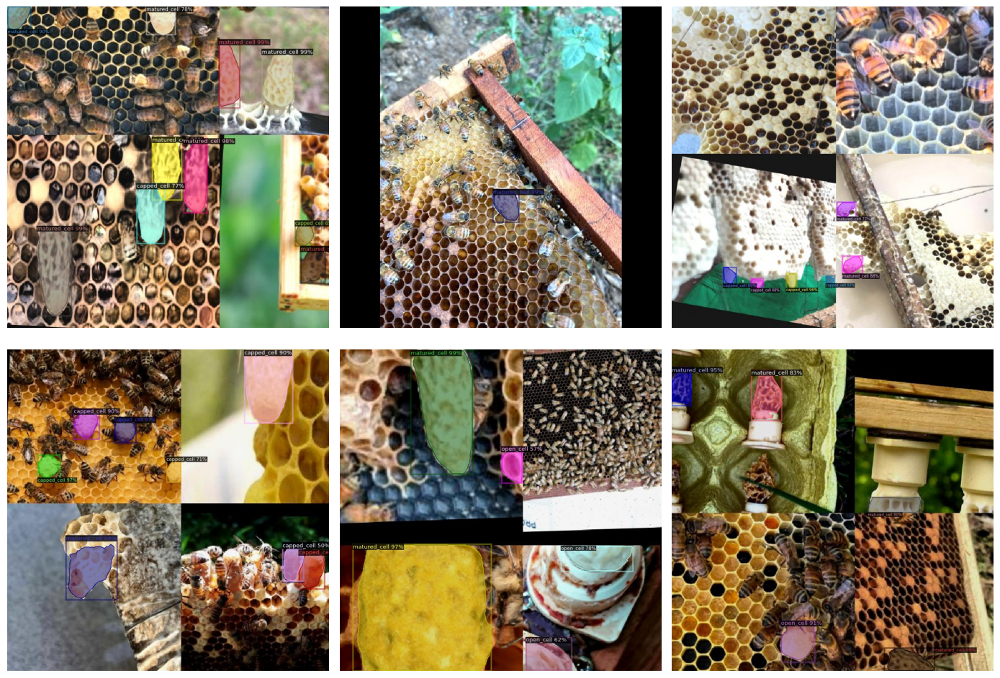

In [56]:
import matplotlib.pyplot as plt
import cv2, glob, random

results = glob.glob("/content/detectron2/visual_samples/*")
samples = random.sample(results, min(6, len(results)))

plt.figure(figsize=(14, 10))

for i, img in enumerate(samples):
    plt.subplot(2, 3, i+1)
    plt.imshow(cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()


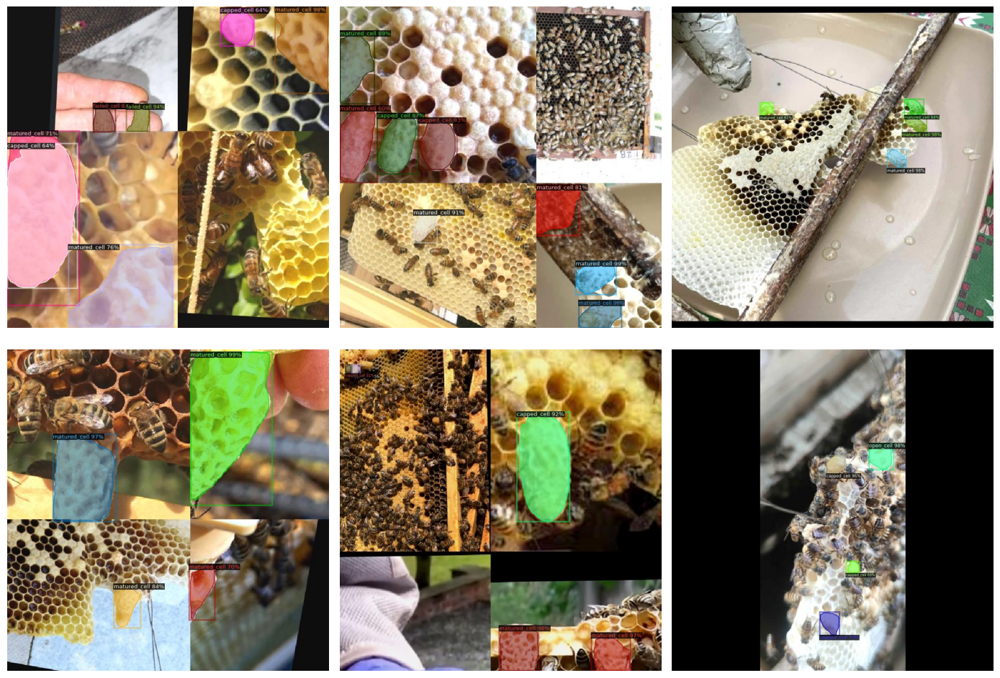

In [72]:
import matplotlib.pyplot as plt
import cv2, glob, random

results = glob.glob("/content/detectron2/visual_samples/*")
samples = random.sample(results, min(6, len(results)))

plt.figure(figsize=(14, 10))

for i, img in enumerate(samples):
    plt.subplot(2, 3, i+1)
    plt.imshow(cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()


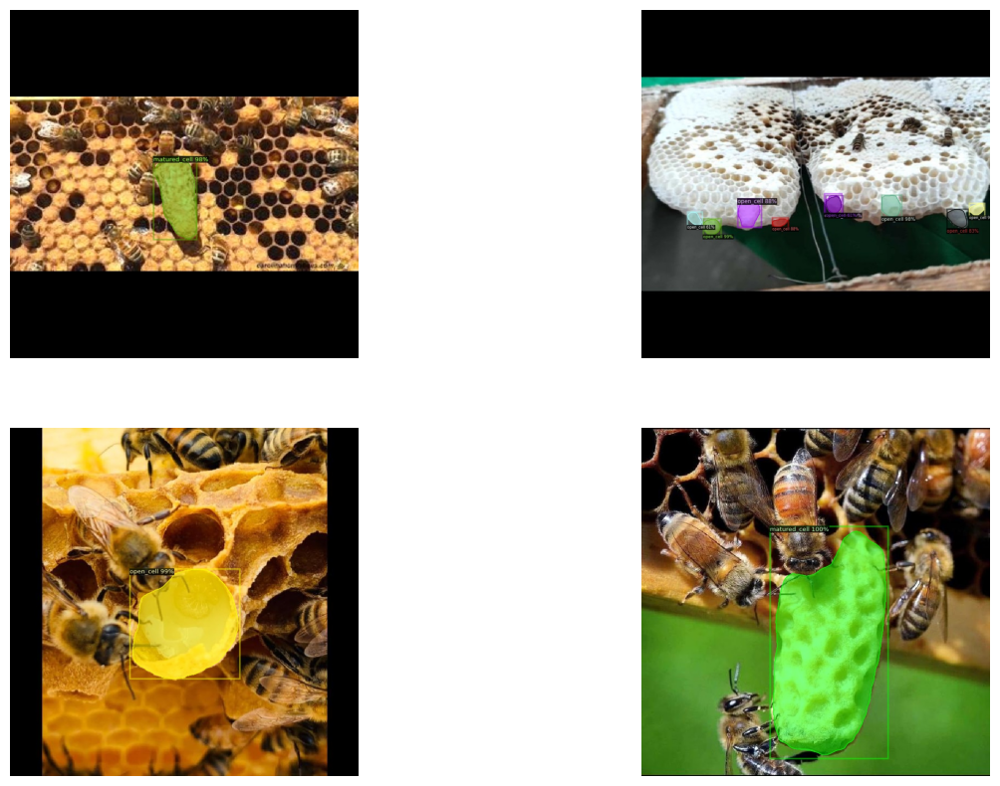

In [41]:
import matplotlib.pyplot as plt
import cv2, glob, random

results = glob.glob("/content/detectron2/visual_samples/*")
samples = random.sample(results, min(4, len(results)))

plt.figure(figsize=(15,10))
for i, img in enumerate(samples):
    plt.subplot(2,2,i+1)
    plt.imshow(cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB))
    plt.axis("off")
plt.show()


# Model Evaluation

[11/03 09:21:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/detectron2/output_queen_cells/model_final.pth ...


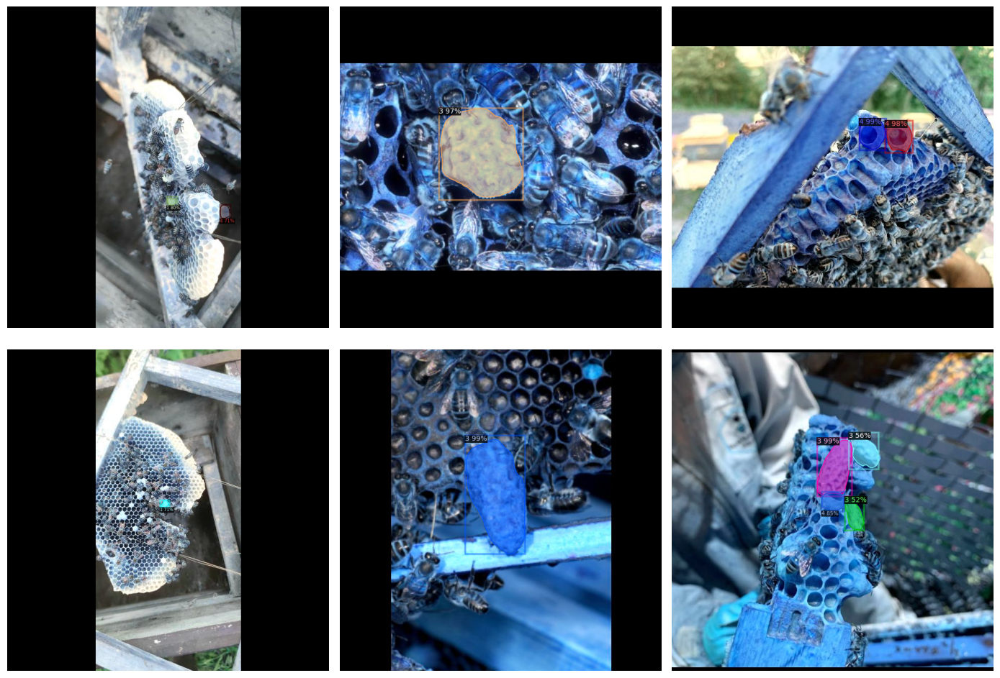

In [90]:
import matplotlib.pyplot as plt
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
import cv2, glob, random

predictor = DefaultPredictor(cfg)
test_images = glob.glob("/content/detectron2/queen-cells-segment-1/test/*.*")

# Random exactly 6 images (assumes at least 6 images exist)
samples = random.sample(test_images, 6)

plt.figure(figsize=(14, 10))

for i, img_path in enumerate(samples):
    img = cv2.imread(img_path)
    outputs = predictor(img)

    v = Visualizer(img[:, :, ::-1], scale=1.0)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    plt.subplot(2, 3, i+1)  # 2 rows x 3 columns
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis("off")

plt.tight_layout()
plt.show()


[11/03 09:22:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/detectron2/output_queen_cells/model_final.pth ...


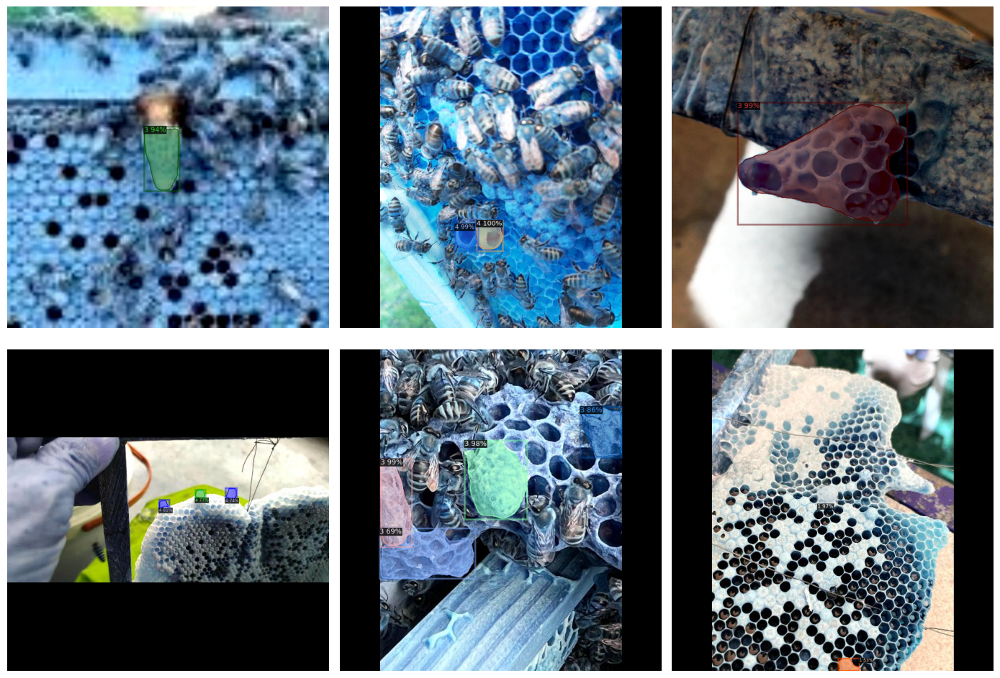

In [95]:
import matplotlib.pyplot as plt
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
import cv2, glob, random

predictor = DefaultPredictor(cfg)
test_images = glob.glob("/content/detectron2/queen-cells-segment-1/test/*.*")

# Random exactly 6 images (assumes at least 6 images exist)
samples = random.sample(test_images, 6)

plt.figure(figsize=(14, 10))

for i, img_path in enumerate(samples):
    img = cv2.imread(img_path)
    outputs = predictor(img)

    v = Visualizer(img[:, :, ::-1], scale=1.0)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    plt.subplot(2, 3, i+1)  # 2 rows x 3 columns
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis("off")

plt.tight_layout()
plt.show()


# Evaluate / Visualize Results

In [100]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Create evaluator for validation dataset
evaluator = COCOEvaluator("queen_cells_val", cfg, False, output_dir="./output")
val_loader = build_detection_test_loader(cfg, "queen_cells_val")

# Run inference & evaluation
results = inference_on_dataset(trainer.model, val_loader, evaluator)
print(results)


WARNING [11/03 09:27:40 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/03 09:27:41 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/03 09:27:41 d2.data.datasets.coco]: Loaded 200 images in COCO format from /content/detectron2/queen-cells-segment-1/valid/_annotations.coco.json
[11/03 09:27:41 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/03 09:27:41 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/03 09:27:41 d2.data.common]: Serializing 200 elements to byte tensors and concatenating them all ...
[11/03 09:27:41 d2.data.common]: Serialized dataset takes 0.20 MiB
[11/03 09:27:41 d2.evaluation.evaluator]: Start inference on 200 batches


This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


[11/03 09:27:44 d2.evaluation.evaluator]: Inference done 11/200. Dataloading: 0.0016 s/iter. Inference: 0.1309 s/iter. Eval: 0.0275 s/iter. Total: 0.1600 s/iter. ETA=0:00:30
[11/03 09:27:49 d2.evaluation.evaluator]: Inference done 66/200. Dataloading: 0.0017 s/iter. Inference: 0.0829 s/iter. Eval: 0.0133 s/iter. Total: 0.0980 s/iter. ETA=0:00:13
[11/03 09:27:54 d2.evaluation.evaluator]: Inference done 124/200. Dataloading: 0.0017 s/iter. Inference: 0.0799 s/iter. Eval: 0.0111 s/iter. Total: 0.0928 s/iter. ETA=0:00:07
[11/03 09:27:59 d2.evaluation.evaluator]: Inference done 178/200. Dataloading: 0.0018 s/iter. Inference: 0.0799 s/iter. Eval: 0.0112 s/iter. Total: 0.0929 s/iter. ETA=0:00:02
[11/03 09:28:01 d2.evaluation.evaluator]: Total inference time: 0:00:18.097957 (0.092810 s / iter per device, on 1 devices)
[11/03 09:28:01 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:15 (0.079580 s / iter per device, on 1 devices)
[11/03 09:28:01 d2.evaluation.coco_evaluation]: 

In [105]:
import json
from collections import Counter

val_json = "/content/detectron2/queen-cells-segment-1/valid/_annotations.coco.json"

with open(val_json) as f:
    data = json.load(f)

# Count all instances per class
cat_map = {cat['id']: cat['name'] for cat in data['categories']}
instances = [cat_map[ann['category_id']] for ann in data['annotations']]
counts = Counter(instances)

print("Validation instances per class:", counts)


Validation instances per class: Counter({'matured_cell': 149, 'open_cell': 107, 'capped_cell': 81, 'failed_cell': 11})


In [97]:
import matplotlib.pyplot as plt
import numpy as np

# Per-class AP values (from your OrderedDict)
classes = ['capped_cell', 'failed_cell', 'matured_cell', 'open_cell', 'semi-matured_cell']
bbox_ap  = [45.04, 63.44, 63.77, 55.57, 0]  # semi-matured_cell nan → set 0 for plotting
segm_ap  = [48.55, 66.84, 68.32, 59.54, 0]

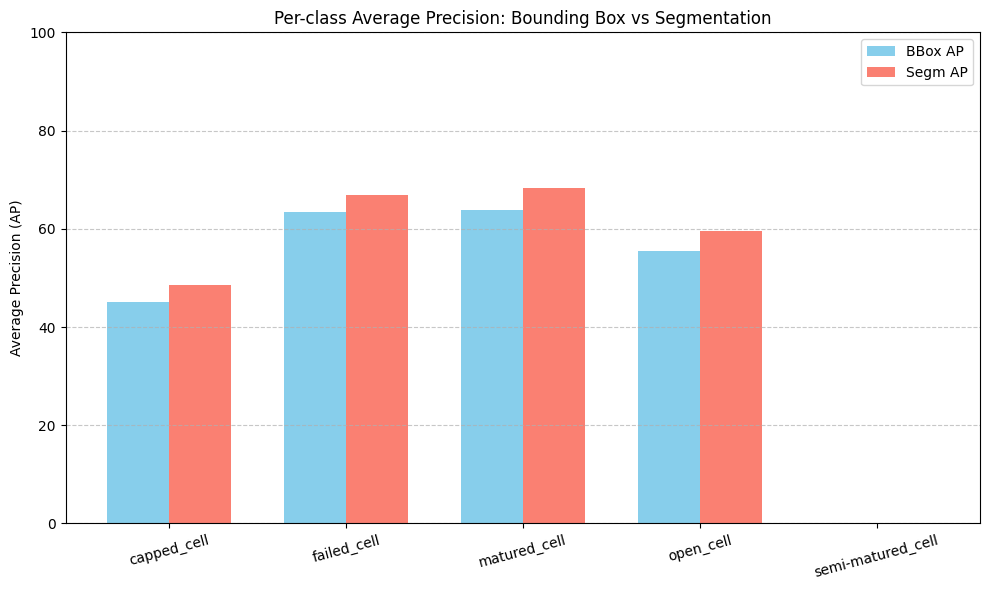

In [98]:
x = np.arange(len(classes))
width = 0.35

plt.figure(figsize=(10,6))
plt.bar(x - width/2, bbox_ap, width, label='BBox AP', color='skyblue')
plt.bar(x + width/2, segm_ap, width, label='Segm AP', color='salmon')
plt.xticks(x, classes, rotation=15)
plt.ylabel("Average Precision (AP)")
plt.title("Per-class Average Precision: Bounding Box vs Segmentation")
plt.ylim(0, 100)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


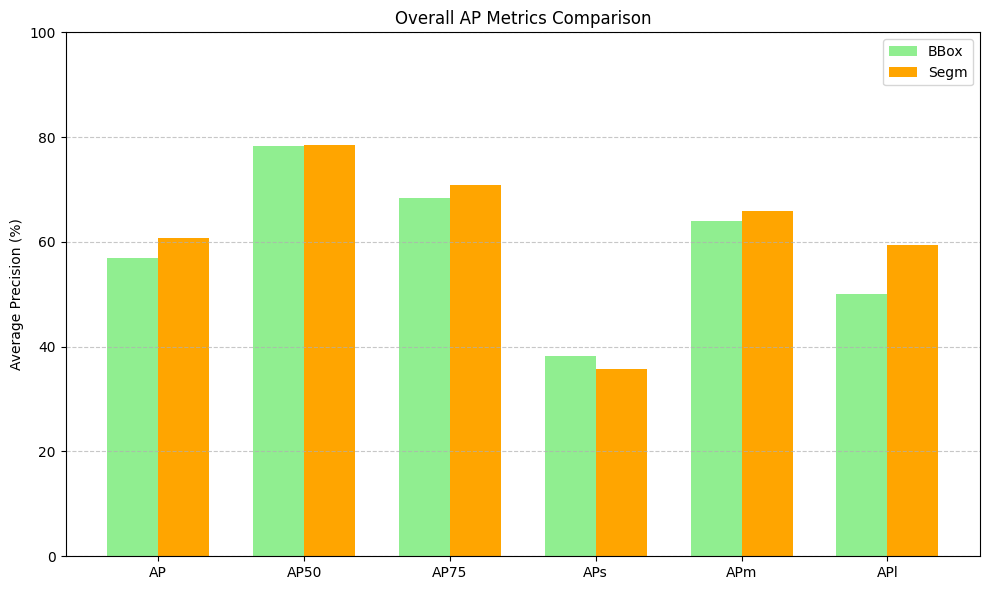

In [99]:
metrics = ['AP', 'AP50', 'AP75', 'APs', 'APm', 'APl']
bbox_overall = [56.96, 78.29, 68.34, 38.18, 63.98, 50.15]
segm_overall = [60.81, 78.54, 70.89, 35.70, 65.99, 59.45]

x = np.arange(len(metrics))
width = 0.35

plt.figure(figsize=(10,6))
plt.bar(x - width/2, bbox_overall, width, label='BBox', color='lightgreen')
plt.bar(x + width/2, segm_overall, width, label='Segm', color='orange')
plt.xticks(x, metrics)
plt.ylabel("Average Precision (%)")
plt.title("Overall AP Metrics Comparison")
plt.ylim(0, 100)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()